# Example of how to run the Calliope-NL model

In [17]:
import calliope
import pandas as pd

calliope.set_log_verbosity('CRITICAL', include_solver_output=False) # Defines how much information you get from the machine as the model gets built and run

# 1. Simple run to find cost-optimal system design

In [2]:
# Load the model from the model.yaml file
model = calliope.Model('model_files/model.yaml', scenario='res_3h')

In [3]:
# Solve the model in 'planning' mode to find the cost-optimal system design
model.run()

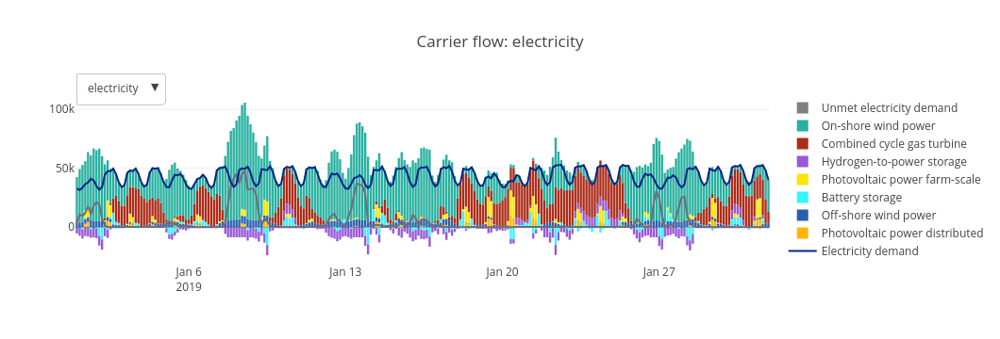

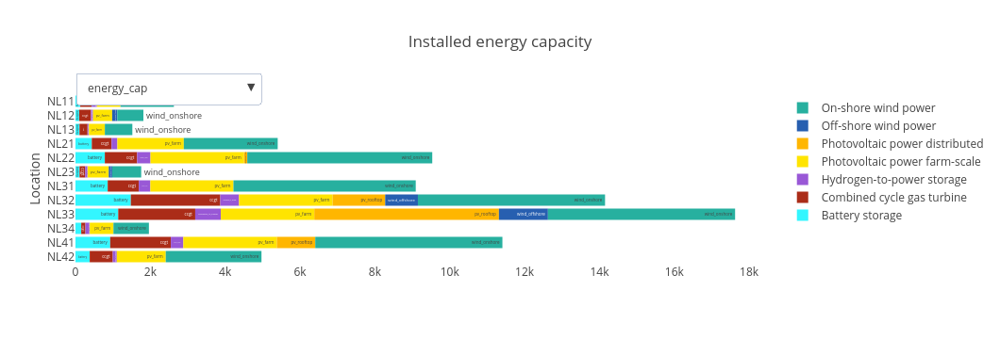

In [20]:
# You may have a first interactive look at the results by plotting the timeseries or the capacity
model.plot.timeseries()
model.plot.capacity()

In [ ]:
# Or you may save a summary of useful visualisation as an html plot
model.plot.summary(to_file='model_files/results/summary_cost-optimal.html')
# And the entire model results as a compact NetCDF file, which you can re-load and further inspect later
model.to_netcdf('model_files/results/cost-optimal_design.nc')

# 2. Create override to fix capacities and analyse the dispatch only

In [6]:
# Let's reload the saved cost-optimal design
model = calliope.read_netcdf('model_files/results/cost-optimal_design.nc')

In [7]:
from convert_plan_to_fixed_design import plan_results_to_fixedcap_override

In [8]:
plan_results_to_fixedcap_override(model, filename='cost-optimal')

# 3. Run the model with a fixed design to analyse only the operation across different scenarios

## 3.1 Simple re-run of the cost-optimal design in operation mode

In [10]:
# Let's now create an operation-only version of the model, fixing the design to what we found before
model_operation = calliope.Model('model_files/model.yaml', scenario='res_3h,fix-design-to-cost-optimal')

In [11]:
# Let's solve the operation as a rolling-horizon model
model_operation.run()

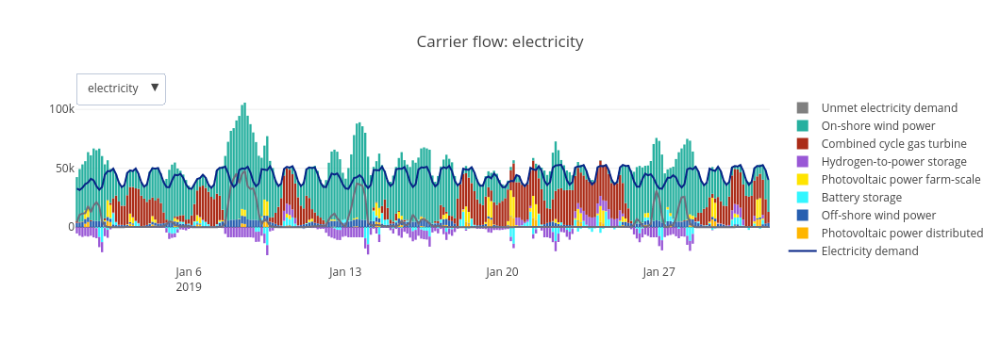

In [18]:
# A summary plot is not available in operation mode, but we can still look at the timeseries
model_operation.plot.timeseries()

## 3.2 Re-run for a different gas price

In [21]:
# Let's create an operation-only version of the model that also changes the weather
model_operation_lowgasprice = calliope.Model('model_files/model.yaml', 
                                      scenario='res_3h,fix-design-to-cost-optimal,low_gas_price')

In [22]:
model_operation_lowgasprice.run()

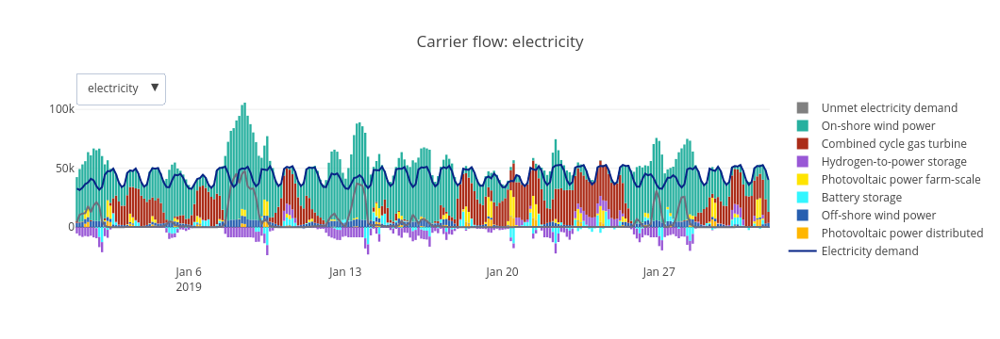

In [23]:
model_operation_lowgasprice.plot.timeseries()

## 3.3 Re-run for a different weather year AND low gas price

In [24]:
# Let's create an operation-only version of the model that changes the weather alongside the gas price
model_operation_2015_lowgasprice = calliope.Model('model_files/model.yaml', 
                                      scenario='res_3h,fix-design-to-cost-optimal,2015_weather_low_gas_price')

In [25]:
model_operation_2015_lowgasprice.run()

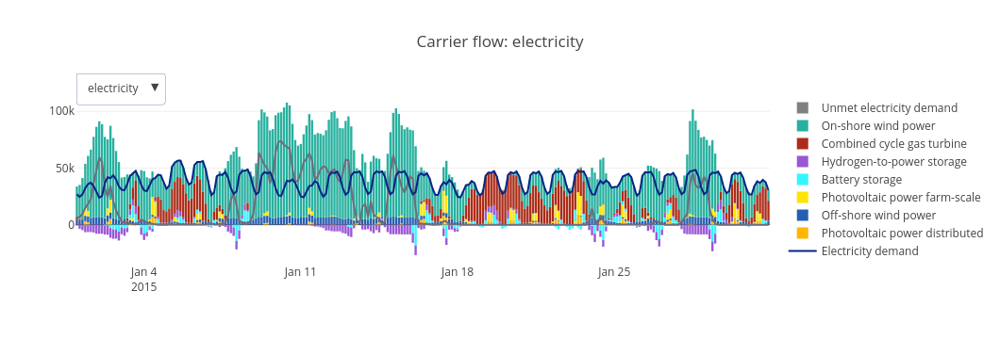

In [26]:
model_operation_2015_lowgasprice.plot.timeseries()

# 4. Generate probabilistic results across different operation scenarios

In [38]:
import matplotlib.pyplot as plt

In [40]:
# Let's look, for instance, at the operation cost
operation_cost_range = [x.get_formatted_array('cost_var').sel(costs='monetary').sum(['timesteps','locs','techs']).to_pandas()
                       for x in [model_operation, model_operation_lowgasprice, model_operation_2015_lowgasprice]]
# And let's convert the costs to Billion EUR
operation_cost_range = [x/1e6 for x in operation_cost_range]

In [93]:
def plot_bar_or_kde_performance(list_of_values, preferred_plot_type='kde'):
    
    fig = plt.figure(figsize=(6,4))
    ax = fig.add_subplot(111)

    if preferred_plot_type == 'kde':
        plot = pd.DataFrame(list_of_values).plot.kde(ax=ax, color='royalblue', lw=2, bw_method=0.5)
        x = plot.get_children()[0]._x
        y = plot.get_children()[0]._y
        ax.fill_between(x,y,color='royalblue',alpha=0.8)
        ax.set_ylim(ymax=3)
        ax.set_xlabel('Billion EUR/year')
    elif preferred_plot_type == 'bar':
        plot = pd.DataFrame(list_of_values).plot.bar(ax=ax, color='royalblue', lw=2, alpha=0.8)
        ax.set_ylim(ymax=max(list_of_values)*1.1)
        ax.set_ylabel('Billion EUR/year')
    else:
        print('Invalid preferred plot type')
    
    ax.set_title('Operation cost')
    ax.margins(0,0)
    ax.legend().set_visible(False)
    
    return

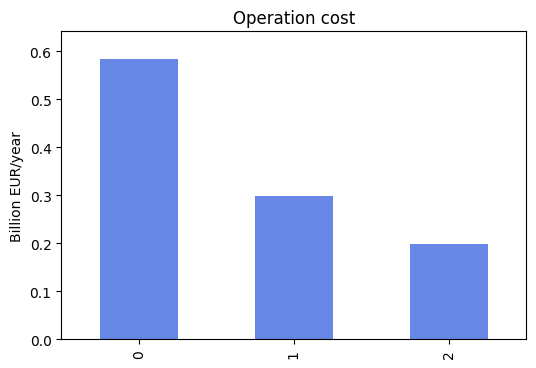

In [94]:
plot_bar_or_kde_performance(operation_cost_range,'bar')

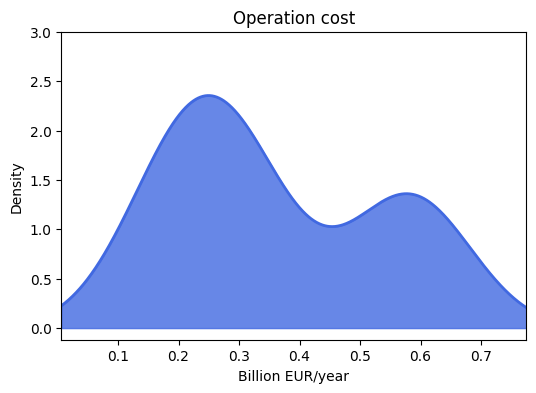

In [91]:
plot_bar_or_kde_performance(operation_cost_range,'kde')